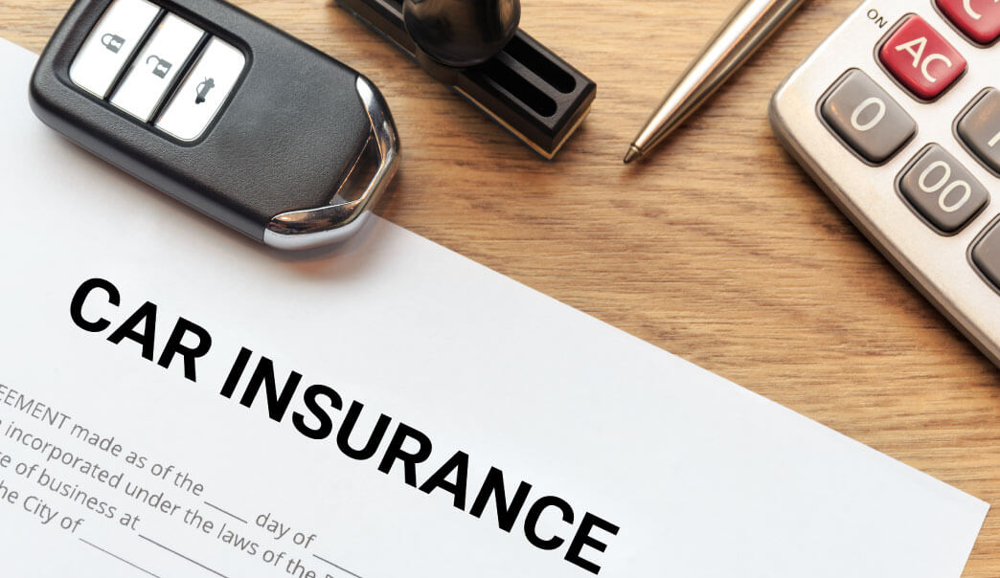

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [70]:
df=pd.read_csv('Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [72]:
#here we can drop _c39,policy_number becuase there is no use in our data set
df=df.drop(columns=['_c39'])

In [73]:
df=df.drop(columns=['policy_number'])

In [74]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_clai

In [75]:
# let's check whether the data has any null values or not.

# but there are '?' in the datset which we have to remove by NaN Values
df = df.replace('?',np.NaN)

df.isnull().any()

months_as_customer             False
age                            False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                  True
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
property_damage                 True
b

There are 3 missing columns

In [76]:
# missing value treatment using fillna

# we will replace the '?' by the most common collision type as we are unaware of the type.
df['collision_type'].fillna(df['collision_type'].mode()[0], inplace = True)

# It may be the case that there are no responses for property damage then we might take it as No property damage.
df['property_damage'].fillna('NO', inplace = True)

# again, if there are no responses fpr police report available then we might take it as No report available
df['police_report_available'].fillna('NO', inplace = True)

In [77]:
df.isnull().any().any()

False

There are no missing values

In [78]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


The mean and min has larger difference in months as customer policy deductable for all of the columns

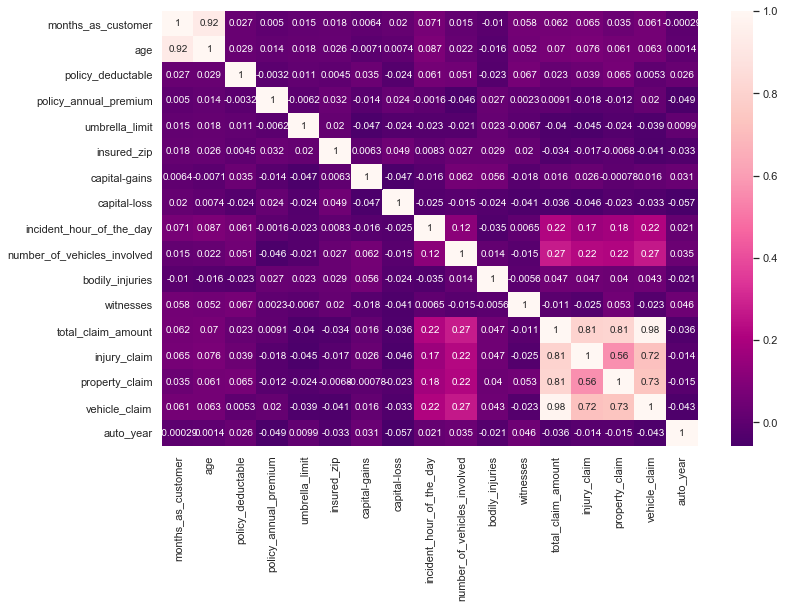

In [79]:
#check correlation
df_cor=df.corr()
plt.figure(figsize=(12,8))
sns.heatmap(df_cor,annot=True,cmap='RdPu_r')
plt.show()

Here lighter color shows positive correltion and negative correlation shows dark colors

In [80]:
#covariance
df_cov=df.cov()
df_cov

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.325104e+04,970.201810,1.888144e+03,1.410315e+02,4.098745e+06,1.476998e+05,2.053193e+04,6.537987e+04,56.525149,1.728322,-0.959327,7.468871,1.887564e+05,3.670575e+04,1.940521e+04,1.326454e+05,-0.202464
age,9.702018e+02,83.544841,1.632352e+02,3.214568e+01,3.806326e+05,1.678029e+04,-1.802445e+03,1.892620e+03,5.538026,0.205834,-0.117534,0.531856,1.685908e+04,3.369297e+03,2.685543e+03,1.080424e+04,0.074430
policy_deductable,1.888144e+03,163.235235,3.743784e+05,-4.848613e+02,1.527928e+07,1.993895e+05,6.005009e+05,-4.048617e+05,259.175175,31.927928,-11.423423,45.313313,3.689501e+05,1.167917e+05,1.912697e+05,6.088869e+04,96.088088
policy_annual_premium,1.410315e+02,32.145675,-4.848613e+02,5.961772e+04,-3.504155e+06,5.664307e+05,-9.349637e+04,1.615803e+05,-2.678940,-11.441581,5.362622,0.632688,5.862176e+04,-2.101409e+04,-1.372875e+04,9.336460e+04,-72.306760
umbrella_limit,4.098745e+06,380632.632633,1.527928e+07,-3.504155e+06,5.278077e+12,3.240420e+09,-3.026763e+09,-1.553189e+09,-371415.415415,-49788.788789,42850.850851,-17204.204204,-2.447073e+09,-5.092246e+08,-2.637003e+08,-1.674148e+09,136733.733734
insured_zip,1.476998e+05,16780.292669,1.993895e+05,5.664307e+05,3.240420e+09,5.141121e+09,1.259612e+07,9.948976e+07,4124.025754,2005.227796,1687.420324,1578.175520,-6.412337e+07,-6.122698e+06,-2.366451e+06,-5.563422e+07,-14120.443708
capital-gains,2.053193e+04,-1802.445245,6.005009e+05,-9.349637e+04,-3.026763e+09,1.259612e+07,7.768588e+08,-3.674132e+07,-3178.586987,1750.552653,1276.184985,-546.757457,1.175952e+07,3.528093e+06,-1.047625e+05,8.336193e+06,5264.676376
capital-loss,6.537987e+04,1892.620220,-4.048617e+05,1.615803e+05,-1.553189e+09,9.948976e+07,-3.674132e+07,7.898403e+08,-4894.551752,-426.512212,-562.812412,-1290.858959,-2.675643e+07,-6.318256e+06,-3.100158e+06,-1.733802e+07,-9571.920821
incident_hour_of_the_day,5.652515e+01,5.538026,2.591752e+02,-2.678940e+00,-3.714154e+05,4.124026e+03,-3.178587e+03,-4.894552e+03,48.321586,0.855540,-0.197045,0.050422,3.995424e+04,5.624392e+03,6.021358e+03,2.830849e+04,0.893562
number_of_vehicles_involved,1.728322e+00,0.205834,3.192793e+01,-1.144158e+01,-4.978879e+04,2.005228e+03,1.750553e+03,-4.265122e+02,0.855540,1.038117,0.011724,-0.016610,7.378070e+03,1.117208e+03,1.076978e+03,5.183885e+03,0.211795


In [81]:
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [82]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])

In [83]:
df['incident_date']=pd.to_datetime(df['incident_date'])

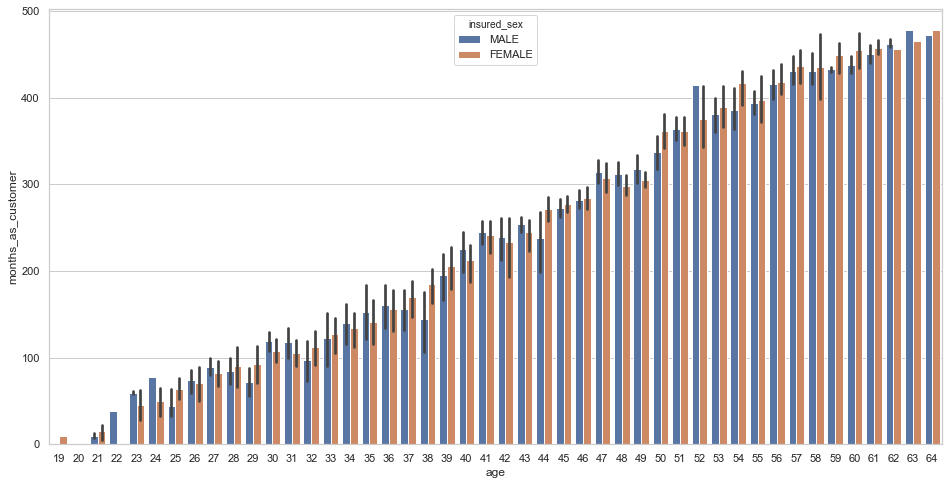

In [84]:
plt.figure(figsize=(16,8))
sns.barplot(y='months_as_customer',x='age',hue='insured_sex',data=df)
sns.set(style='whitegrid')

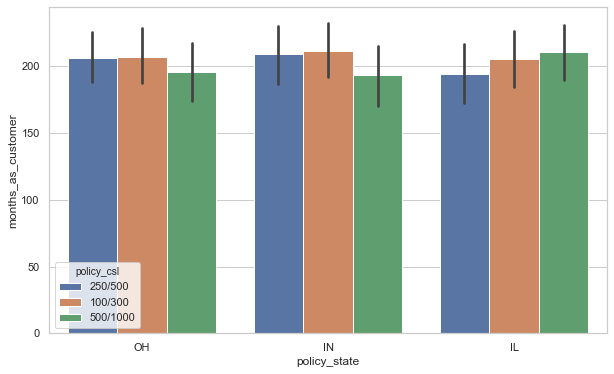

In [85]:
plt.figure(figsize=(10,6))
sns.barplot(y='months_as_customer',x='policy_state',hue='policy_csl',data=df)
plt.show()

<Figure size 720x432 with 0 Axes>

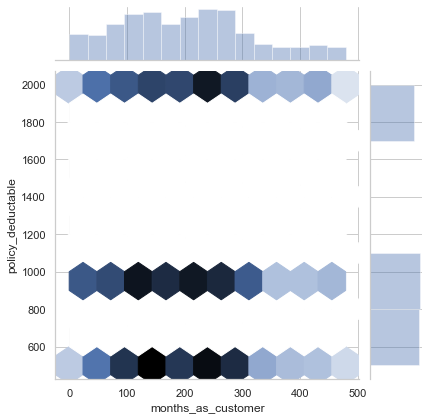

In [86]:
plt.figure(figsize=(10,6))
sns.jointplot(x='months_as_customer',y='policy_deductable',data=df,kind='hex')
plt.show()

<Figure size 720x432 with 0 Axes>

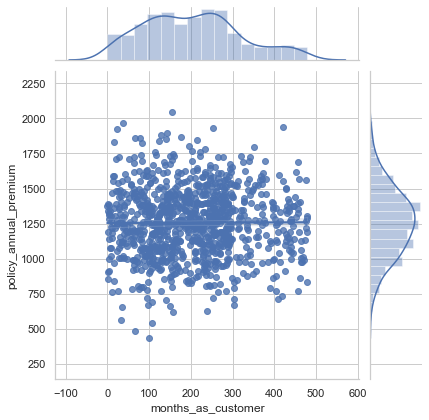

In [87]:
plt.figure(figsize=(10,6))
sns.jointplot(x='months_as_customer',y='policy_annual_premium',data=df,kind='reg')
plt.show()

<Figure size 720x432 with 0 Axes>

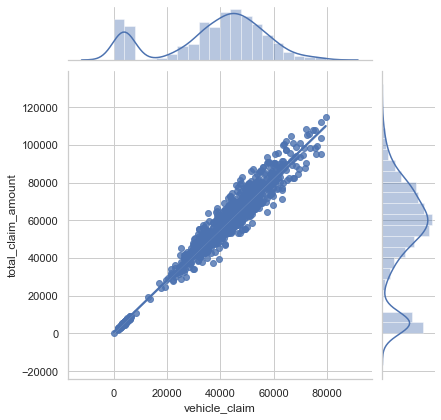

In [88]:
plt.figure(figsize=(10,6))
sns.jointplot(x='vehicle_claim',y='total_claim_amount',data=df,kind='reg')
plt.show()

<Figure size 720x432 with 0 Axes>

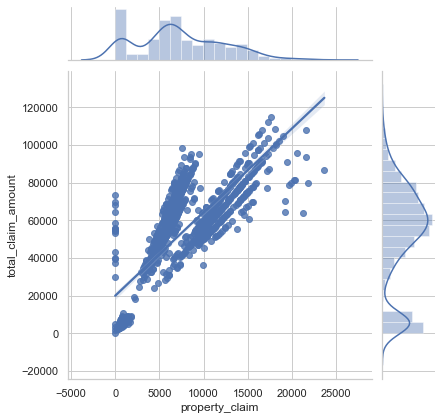

In [89]:
plt.figure(figsize=(10,6))
sns.jointplot(x='property_claim',y='total_claim_amount',data=df,kind='reg')
plt.show()

<Figure size 720x432 with 0 Axes>

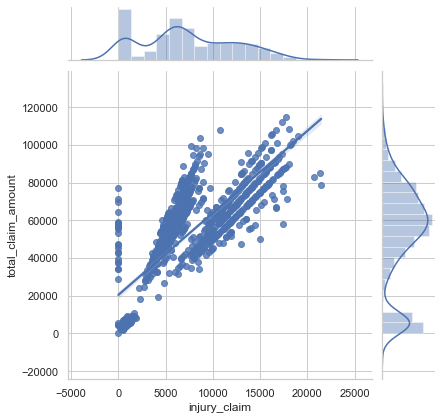

In [90]:
plt.figure(figsize=(10,6))
sns.jointplot(x='injury_claim',y='total_claim_amount',data=df,kind='reg')
plt.show()

<Figure size 720x432 with 0 Axes>

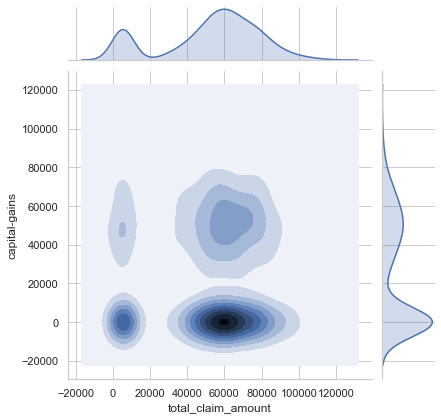

In [91]:
plt.figure(figsize=(10,6))
sns.jointplot(y='capital-gains',x='total_claim_amount',data=df,kind='kde')
plt.show()

<Figure size 720x432 with 0 Axes>

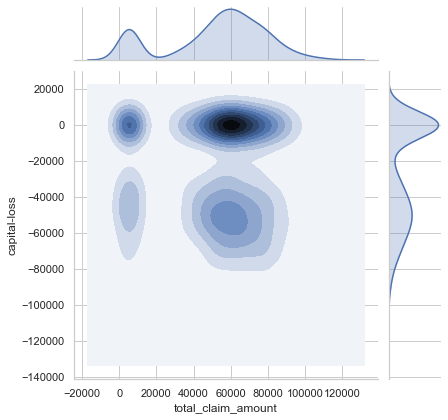

In [92]:
plt.figure(figsize=(10,6))
sns.jointplot(y='capital-loss',x='total_claim_amount',data=df,kind='kde')
plt.show()

<Figure size 720x432 with 0 Axes>

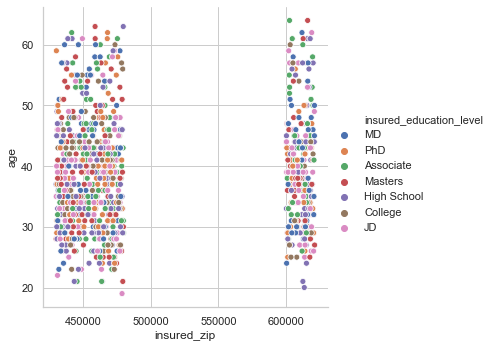

In [93]:
plt.figure(figsize=(10,6))
sns.relplot(y='age',x='insured_zip',hue='insured_education_level',data=df)
plt.show()

In [94]:
df_occupation=df.groupby('insured_occupation',axis=0).sum()

Text(0.5, 1.0, 'occupation based on months as customer')

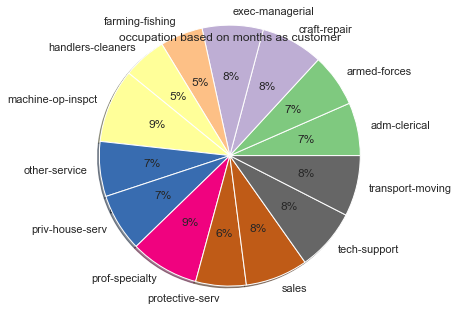

In [95]:
df_occupation['months_as_customer'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',cmap='Accent',explode=[0,0,0,0,0,0,0,0,0,0,0,0,0,0])
plt.title('occupation based on months as customer')

Text(0.5, 1.0, 'occupation based on ploicy deducted')

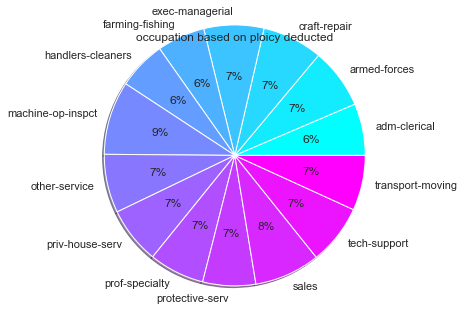

In [96]:
df_occupation['policy_deductable'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',cmap='cool',explode=[0,0,0,0,0,0,0,0,0,0,0,0,0,0])
plt.title('occupation based on ploicy deducted')

Text(0.5, 1.0, 'occupation based on age')

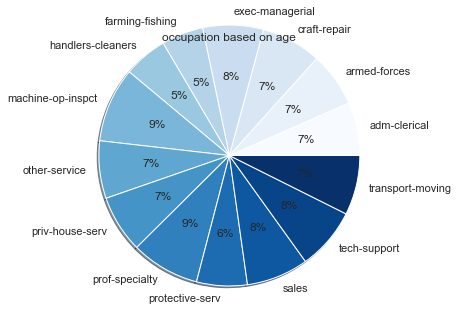

In [97]:
df_occupation['age'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',cmap='Blues',explode=[0,0,0,0,0,0,0,0,0,0,0,0,0,0])
plt.title('occupation based on age')

Text(0.5, 1.0, 'occupation policy annual premium')

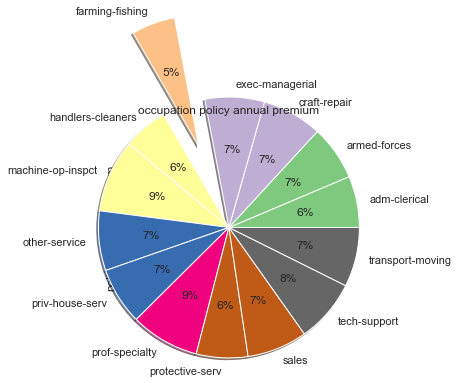

In [98]:
df_occupation['policy_annual_premium'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',cmap='Accent',explode=[0,0,0,0,1,0,0,0,0,0,0,0,0,0])
plt.title('occupation policy annual premium')

Text(0.5, 1.0, 'occupation based on age')

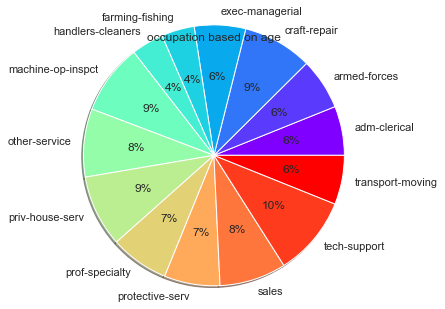

In [99]:
df_occupation['umbrella_limit'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',cmap='rainbow',explode=[0,0,0,0,0,0,0,0,0,0,0,0,0,0])
plt.title('occupation based on age')

In [100]:
df_fraud=df.groupby('fraud_reported',axis=0).sum()

Text(0.5, 1.0, 'fraud report based on months as customer')

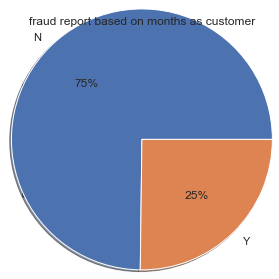

In [101]:
df_fraud['months_as_customer'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',explode=[0,0])
plt.title('fraud report based on months as customer')

Text(0.5, 1.0, 'fraud report based on age')

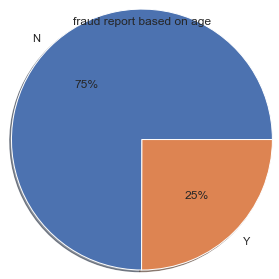

In [102]:
df_fraud['policy_deductable'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',explode=[0,0])
plt.title('fraud report based on age')

Text(0.5, 1.0, 'fraud report based on months as customer')

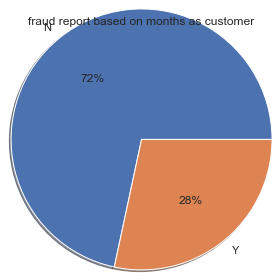

In [103]:
df_fraud['vehicle_claim'].plot(kind='pie',radius=1.5,shadow=True,autopct='%0.0f%%',explode=[0,0])
plt.title('fraud report based on months as customer')

In [104]:
#use label encoder
from sklearn import preprocessing
le=preprocessing.LabelEncoder()
le_count=0
for col in df.columns[1:]:
    if df[col].dtype=='object':
        if len(list(df[col].unique())) <=30:
            le.fit(df[col])
            df[col]=le.transform(df[col])
            le_count +=1
print('{}columns were label encoded.'.format(le_count))

17columns were label encoded.


In [105]:
#another 2 columns has to label encode
label=le.fit_transform(df['incident_location'])

In [106]:
df.drop(columns=['incident_location'])

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2014-10-17,2,1,1000,1406.91,0,466132,1,...,2,1,71610,6510,13020,52080,10,92x,2004,1
1,228,42,2006-06-27,1,1,2000,1197.22,5000000,468176,1,...,0,0,5070,780,780,3510,8,E400,2007,1
2,134,29,2000-06-09,2,0,2000,1413.14,5000000,430632,0,...,3,0,34650,7700,3850,23100,4,RAM,2007,0
3,256,41,1990-05-25,0,1,2000,1415.74,6000000,608117,0,...,2,0,63400,6340,6340,50720,3,Tahoe,2014,1
4,228,44,2014-06-06,0,2,1000,1583.91,6000000,610706,1,...,1,0,6500,1300,650,4550,0,RSX,2009,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1991-07-16,2,2,1000,1310.80,0,431289,0,...,1,0,87200,17440,8720,61040,6,Accord,2006,0
996,285,41,2014-05-01,0,0,1000,1436.79,0,608177,0,...,3,0,108480,18080,18080,72320,13,Passat,2015,0
997,130,34,2003-02-17,2,1,500,1383.49,3000000,442797,0,...,3,1,67500,7500,7500,52500,11,Impreza,1996,0
998,458,62,2011-11-18,0,2,2000,1356.92,5000000,441714,1,...,1,1,46980,5220,5220,36540,1,A5,1998,0


In [107]:
df['incident_location']=label

In [108]:
label=le.fit_transform(df['auto_model'])

In [109]:
df.drop(columns=['auto_model'])

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,2014-10-17,2,1,1000,1406.91,0,466132,1,...,1,2,1,71610,6510,13020,52080,10,2004,1
1,228,42,2006-06-27,1,1,2000,1197.22,5000000,468176,1,...,0,0,0,5070,780,780,3510,8,2007,1
2,134,29,2000-06-09,2,0,2000,1413.14,5000000,430632,0,...,2,3,0,34650,7700,3850,23100,4,2007,0
3,256,41,1990-05-25,0,1,2000,1415.74,6000000,608117,0,...,1,2,0,63400,6340,6340,50720,3,2014,1
4,228,44,2014-06-06,0,2,1000,1583.91,6000000,610706,1,...,0,1,0,6500,1300,650,4550,0,2009,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1991-07-16,2,2,1000,1310.80,0,431289,0,...,0,1,0,87200,17440,8720,61040,6,2006,0
996,285,41,2014-05-01,0,0,1000,1436.79,0,608177,0,...,2,3,0,108480,18080,18080,72320,13,2015,0
997,130,34,2003-02-17,2,1,500,1383.49,3000000,442797,0,...,2,3,1,67500,7500,7500,52500,11,1996,0
998,458,62,2011-11-18,0,2,2000,1356.92,5000000,441714,1,...,0,1,1,46980,5220,5220,36540,1,1998,0


In [110]:
df['auto_model']=label

In [111]:
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                            int32
policy_csl                              int32
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                             int32
insured_education_level                 int32
insured_occupation                      int32
insured_hobbies                         int32
insured_relationship                    int32
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                           int32
collision_type                          int32
incident_severity                       int32
authorities_contacted                   int32
incident_state                    

In [112]:
#drop policy_bind_date,incident_date there is no use in data
df=df.drop(columns=['policy_bind_date','incident_date'])

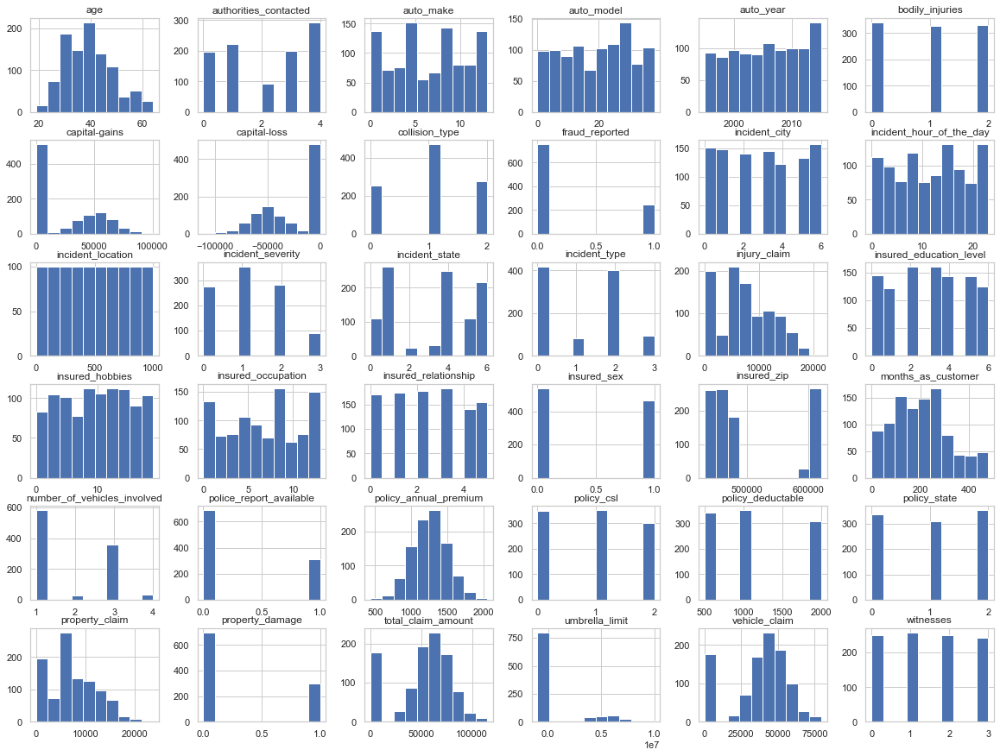

In [113]:
df.hist(figsize=(20,15))
plt.show()

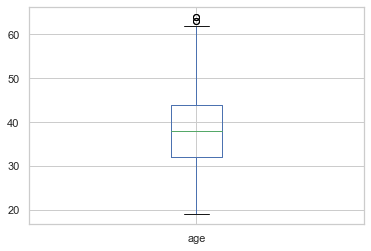

In [114]:
#CHECK OUTLIERS
df['age'].plot.box()

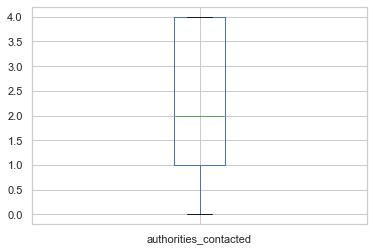

In [115]:
df['authorities_contacted'].plot.box()

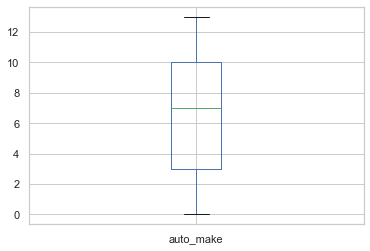

In [116]:
df['auto_make'].plot.box()

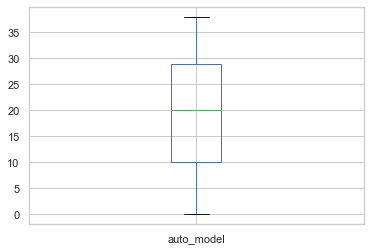

In [117]:
df['auto_model'].plot.box()

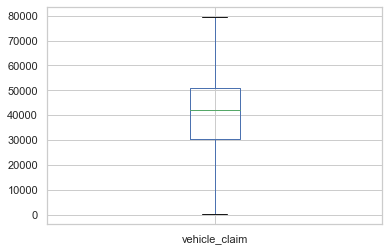

In [118]:
df['vehicle_claim'].plot.box()

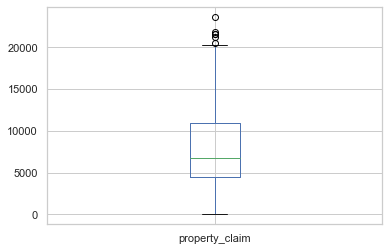

In [119]:
df['property_claim'].plot.box()

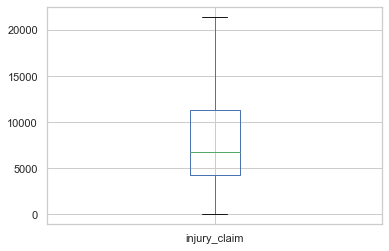

In [120]:
df['injury_claim'].plot.box()

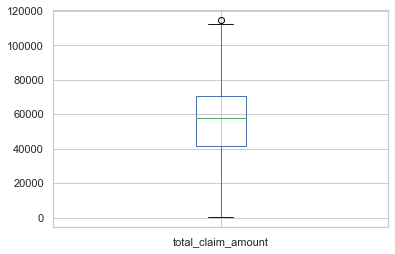

In [121]:
df['total_claim_amount'].plot.box()

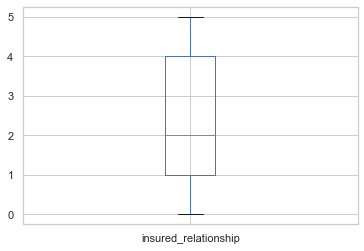

In [122]:
df['insured_relationship'].plot.box()

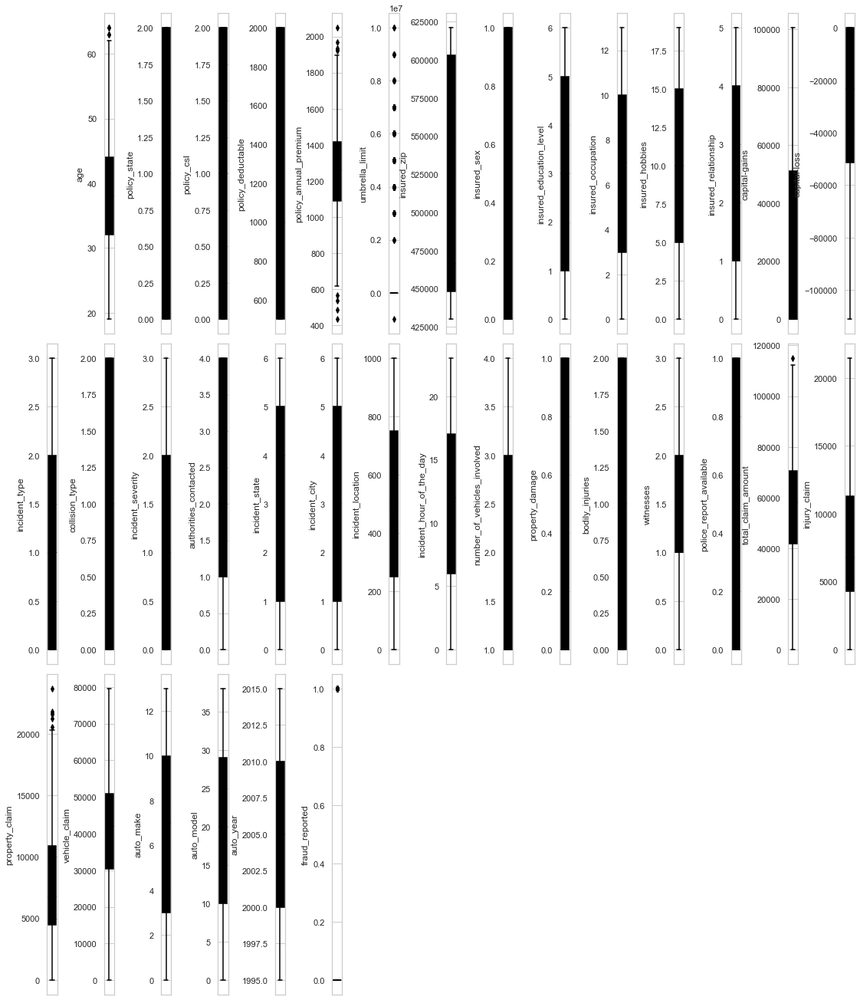

In [123]:
#lets see outliers at a time
collist=df.columns.values
ncol=15
nrows=20
plt.figure(figsize=(ncol,8*ncol))
for i in range(1, len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='black',orient='v')
    plt.tight_layout()

In [124]:
#check skewness
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806


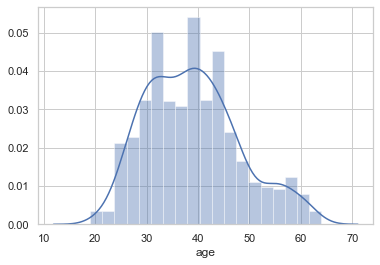

In [125]:
sns.distplot(df['age'])

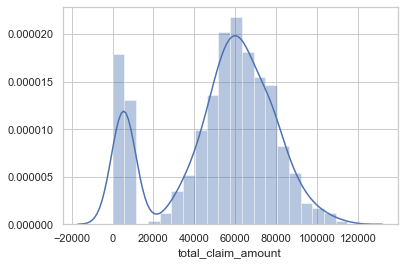

In [126]:
sns.distplot(df['total_claim_amount'])

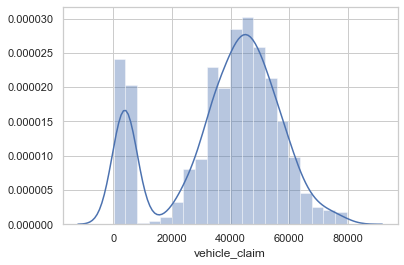

In [127]:
sns.distplot(df['vehicle_claim'])

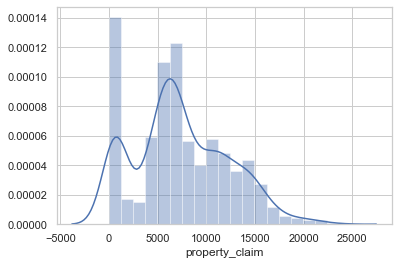

In [128]:
sns.distplot(df['property_claim'])

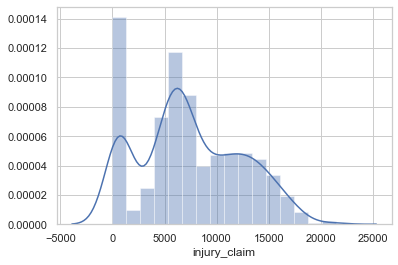

In [129]:
sns.distplot(df['injury_claim'])

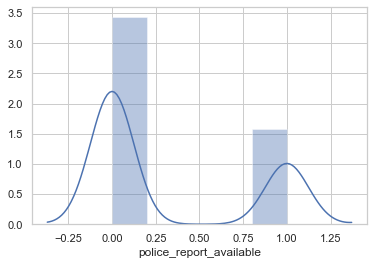

In [130]:
sns.distplot(df['police_report_available'])

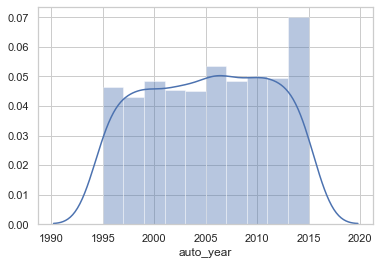

In [131]:
sns.distplot(df['auto_year'])

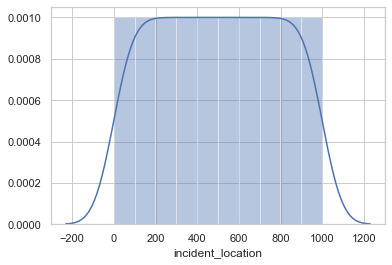

In [132]:
sns.distplot(df['incident_location'])

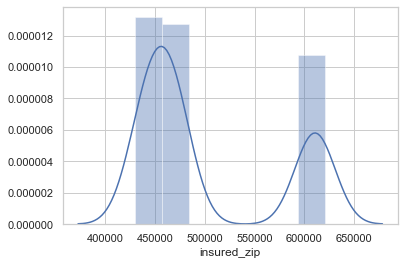

In [133]:
sns.distplot(df['insured_zip'])

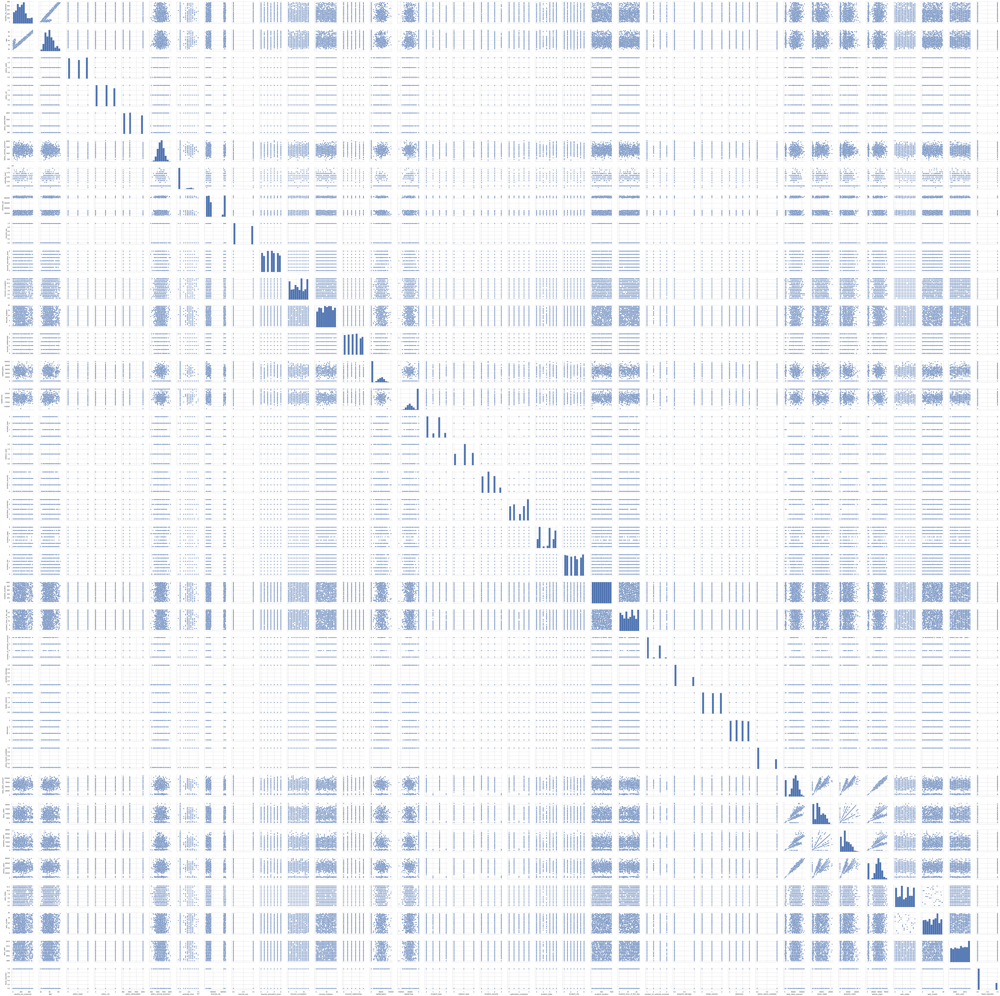

In [134]:
sns.pairplot(df)

In [135]:
#REMOVING OUTLIERS
from scipy.stats import zscore
z=np.abs(zscore(df))
z

array([[1.07813958, 0.99083647, 1.18717314, ..., 1.64574255, 0.1834404 ,
        1.74601919],
       [0.2089946 , 0.33407345, 0.01685641, ..., 0.65747047, 0.31549088,
        1.74601919],
       [0.60800168, 1.08891308, 1.18717314, ..., 0.95970204, 0.31549088,
        0.57273139],
       ...,
       [0.64276748, 0.54161057, 1.18717314, ..., 0.02857005, 1.5139238 ,
        0.57273139],
       [2.20802805, 2.52328351, 1.22088596, ..., 1.28637088, 1.18130295,
        0.57273139],
       [2.19064515, 2.3043625 , 1.18717314, ..., 0.65747047, 0.31549088,
        0.57273139]])

In [136]:
Threshold=3
print(np.where(z>3))

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
       657, 700, 763, 807, 875, 922, 975], dtype=int64), array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 30,  6,  6,  6,  5, 14,
        6,  6,  6], dtype=int64))


In [137]:
z[31][6]

3.0044538458871766

In [138]:
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2,1,1000,1406.91,0,466132,1,4,...,2,1,71610,6510,13020,52080,10,1,2004,1
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,0,0,5070,780,780,3510,8,12,2007,1
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,3,0,34650,7700,3850,23100,4,30,2007,0
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,...,2,0,63400,6340,6340,50720,3,34,2014,1
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,...,1,0,6500,1300,650,4550,0,31,2009,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,431289,0,5,...,1,0,87200,17440,8720,61040,6,6,2006,0
996,285,41,0,0,1000,1436.79,0,608177,0,6,...,3,0,108480,18080,18080,72320,13,28,2015,0
997,130,34,2,1,500,1383.49,3000000,442797,0,5,...,3,1,67500,7500,7500,52500,11,19,1996,0
998,458,62,0,2,2000,1356.92,5000000,441714,1,0,...,1,1,46980,5220,5220,36540,1,5,1998,0


In [139]:
print(df.shape,df_new.shape)

(1000, 36) (980, 36)


In [140]:
df=df_new

In [141]:
df.shape

(980, 36)

20 outliers are removed

In [142]:
#split data
x=df.iloc[:,:-1]
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,2,1,1000,1406.91,0,466132,1,4,...,1,2,1,71610,6510,13020,52080,10,1,2004
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,0,0,0,5070,780,780,3510,8,12,2007
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,2,3,0,34650,7700,3850,23100,4,30,2007
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,...,1,2,0,63400,6340,6340,50720,3,34,2014
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,...,0,1,0,6500,1300,650,4550,0,31,2009


In [143]:
y=df.iloc[:,35:]
y.head()

,fraud_reported
0,1
1,1
2,0
3,1
4,0


1-yes,0-no

In [144]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[ 1.06956809,  0.98335151,  1.17982066, ...,  0.85195935,
        -1.64044692, -0.18859446],
       [ 0.20272605,  0.32971067, -0.0245796 , ...,  0.35527871,
        -0.65173967,  0.31047639],
       [-0.61210547, -1.08651116,  1.17982066, ..., -0.63808258,
         0.96614491,  0.31047639],
       ...,
       [-0.64677915, -0.54181045,  1.17982066, ...,  1.10029967,
        -0.02256234, -1.51945005],
       [ 2.19646275,  2.50851348, -1.22897986, ..., -1.38310355,
        -1.28091701, -1.18673615],
       [ 2.17912591,  2.2906332 ,  1.17982066, ...,  0.35527871,
        -0.65173967,  0.31047639]])

In [145]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [146]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=9,test_size=0.3,stratify=y)

In [147]:
print(x_train.shape,x_test.shape)
print(y_train.shape,y_test.shape)

(686, 35) (294, 35)
(686, 1) (294, 1)


In [148]:
knn=KNeighborsClassifier()
dt=DecisionTreeClassifier(random_state=6)
sv=SVC()
lr=LogisticRegression()
gn=GaussianNB()

In [149]:
models = []
models.append(('KNneighborsClassifier',knn))
models.append(('DecisionTreeClassifier',dt))
models.append(('SVC',sv))
models.append(('LogisticRegression',lr))
models.append(('GaussianNB',gn))

*************************** KNneighborsClassifier ***************************


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')


AccuracyScore= 0.7312925170068028


cross_val_score= 0.7153061224489795


roc_auc_score= 0.5452327327327328


classification_report
               precision    recall  f1-score   support

           0       0.77      0.91      0.84       222
           1       0.39      0.18      0.25        72

    accuracy                           0.73       294
   macro avg       0.58      0.55      0.54       294
weighted avg       0.68      0.73      0.69       294



[[202  20]
 [ 59  13]]


AxesSubplot(0.125,0.808774;0.62x0.0712264)



*************************** DecisionTreeClassifier ***************************


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max

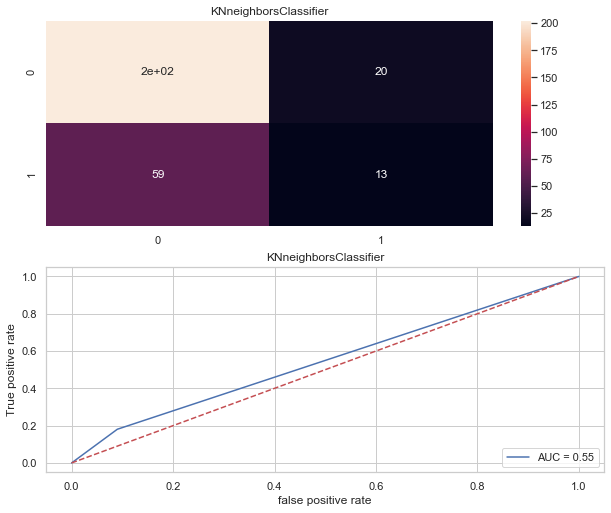

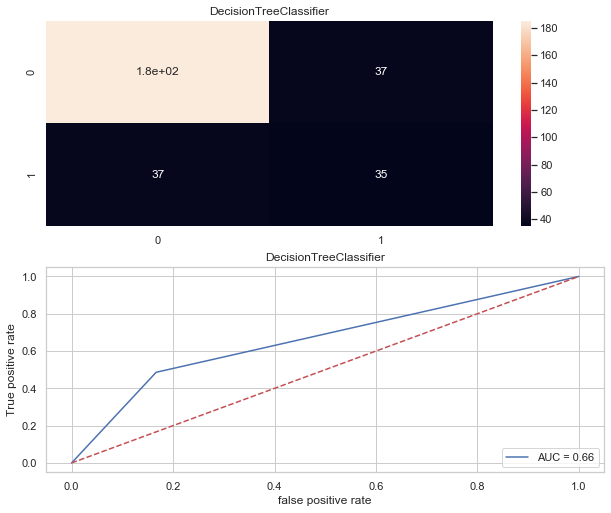

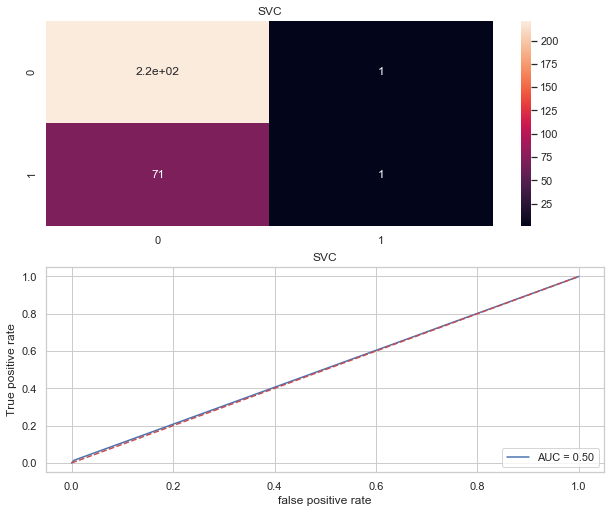

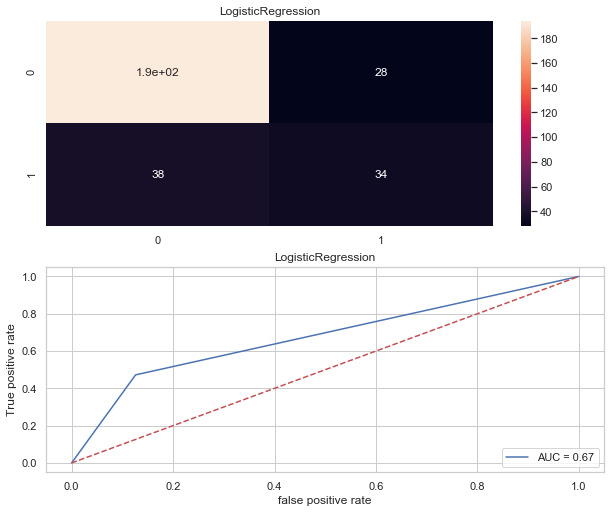

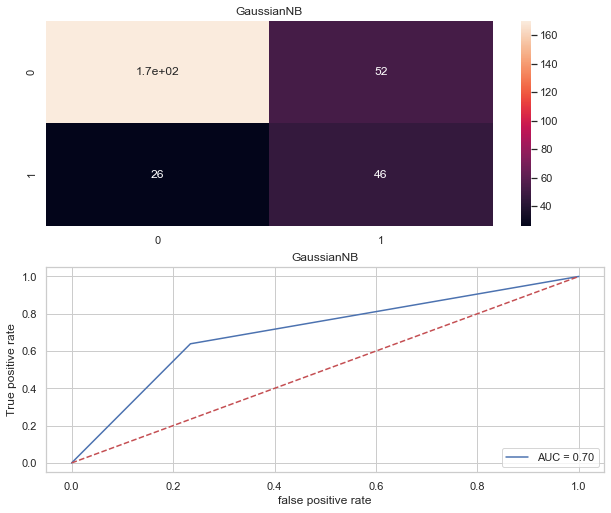

In [150]:
Model = []
score = []
cvs = []
rocscore=[]
for name,model in models:
    print('***************************',name,'***************************')
    print('\n')
    Model.append(name)
    model.fit(x_train,y_train)
    print(model)
    pre=model.predict(x_test)
    print('\n')
    AS=accuracy_score(y_test,pre)
    print('AccuracyScore=',AS)
    score.append(AS*100)
    print('\n')
    sc=cross_val_score(model,x,y,cv=10,scoring='accuracy').mean()
    print('cross_val_score=',sc)
    cvs.append(sc*100)
    print('\n')
    false_positive_rate,true_positive_rate,thresholds = roc_curve(y_test,pre)
    roc_auc=auc(false_positive_rate,true_positive_rate)
    print('roc_auc_score=',roc_auc)
    rocscore.append(roc_auc*100)
    print('\n')
    print('classification_report\n',classification_report(y_test,pre))
    print('\n')
    cm=confusion_matrix(y_test,pre)
    print(cm)
    print('\n')
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True,cmap='rocket'))
    plt.subplot(912)
    plt.title(name)
    plt.plot(false_positive_rate,true_positive_rate,label='AUC = %0.2f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True positive rate')
    plt.xlabel('false positive rate')
    print('\n\n')

In [151]:
result=pd.DataFrame({'Model':Model,'Accuracy_score':score,'Cross_val_score':cvs,'roc_auc_curve':rocscore})
result

,Model,Accuracy_score,Cross_val_score,roc_auc_curve
0,KNneighborsClassifier,73.129252,71.530612,54.523273
1,DecisionTreeClassifier,74.829932,77.244898,65.972222
2,SVC,75.510204,74.693878,50.469219
3,LogisticRegression,77.551020,77.142857,67.304805
4,GaussianNB,73.469388,72.346939,70.232733


here LogisticRegression is good for prediction model

In [152]:
from sklearn.model_selection import GridSearchCV

In [153]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
grid_param={
    'criterion': ['gini','entropy']
}
gd_sr=GridSearchCV(estimator=dtc,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'criterion': 'entropy'}
0.7714285714285715


In [154]:
sv=SVC()
grid_param={
    'kernel': ['rbf','linear','poly']
}
gd_sr=GridSearchCV(estimator=sv,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'kernel': 'linear'}
0.7826530612244897


In [155]:
#PREDICT THE VALUES
pred=lr.predict(x_test)
print('predicted result:',pre)
print('actual:',y_test)

predicted result: [0 0 0 0 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 0
 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 1 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 1 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 1 0
 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1
 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1
 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 1 1]
actual:      fraud_reported
179               0
225               0
358               1
170               0
977               1
..              ...
574               1
641               0
626               0
349               1
880               1

[294 rows x 1 columns]


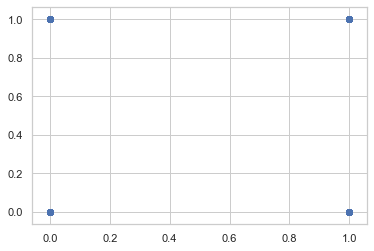

In [156]:
print(plt.scatter(x=y_test,y=pre))
plt.show()

In [157]:
from joblib import dump,load
dump(df,'AUTO_INSURANCE_FRAUD.joblib')

['AUTO_INSURANCE_FRAUD.joblib']